## Training a robot to walk

In [17]:
import gym
env = gym.make('BipedalWalker-v2')

for episode in range(100):
    observation = env.reset()
    for i in range(10000):
        env.render()
        action = env.action_space.sample()
        observation, reward, done, info = env.step(action)
        if done:
            print('{} timesteps taken for the episode'.format(i+1))
            break
    

[2019-12-29 00:17:38,419] Making new env: BipedalWalker-v2


universe-IRw8NH-0 | [2019-12-28 18:47:38,768] [INFO:universe.wrappers.logger] Stats for the past 5.01s: vnc_updates_ps=4.6 n=1 reaction_time=None observation_lag=None action_lag=None reward_ps=0.0 reward_total=0.0 vnc_bytes_ps[total]=5850.0 vnc_pixels_ps[total]=43338.5 reward_lag=None rewarder_message_lag=None fps=60.02


[2019-12-29 00:17:39,160] Killing and removing container: id=d365b258b09ba360a04f13eecbcd94f25500f2e2d38f23639f637701197ed266


universe-IRw8NH-0 | [tigervnc] 
universe-IRw8NH-0 | [tigervnc] Sat Dec 28 18:47:39 2019
universe-IRw8NH-0 | [tigervnc]  Connections: closed: 172.17.0.1::55548 (Clean disconnection)
universe-IRw8NH-0 | [tigervnc]  EncodeManager: Framebuffer updates: 1016
universe-IRw8NH-0 | [tigervnc]  EncodeManager:   Tight:
universe-IRw8NH-0 | [tigervnc]  EncodeManager:     Solid: 172 rects, 3.50481 Mpixels
universe-IRw8NH-0 | [tigervnc]  EncodeManager:            2.6875 KiB (1:5094.95 ratio)
universe-IRw8NH-0 | [tigervnc]  EncodeManager:     Bitmap RLE: 480 rects, 5.37021 Mpixels
universe-IRw8NH-0 | [tigervnc]  EncodeManager:                 61.79 KiB (1:339.586 ratio)
universe-IRw8NH-0 | [tigervnc]  EncodeManager:     Indexed RLE: 1.556 krects, 14.0138 Mpixels
universe-IRw8NH-0 | [tigervnc]  EncodeManager:                  584.501 KiB (1:93.6864 ratio)
universe-IRw8NH-0 | [tigervnc]  EncodeManager:   Tight (JPEG):
universe-IRw8NH-0 | [tigervnc]  EncodeManager:     Full Colour: 7.071 krects, 155.421 

ArgumentError: argument 2: <class 'TypeError'>: wrong type

## Building a video game bot

In [ ]:
# import gym
# import universe #register universe environment
# import random

In [ ]:
# env = gym.make('flashgames.NeonRace-v0')
# #automatically creates a local docker container
# env.configure(remotes=1)
# observation_n = env.reset()

In [ ]:
# ## Declare actions
# #move left
# left = [('KeyEvent', 'ArrowUp', True), 
#         ('KeyEvent', 'ArrowULeft', True),
#        ('KeyEvent', 'ArrowRight', False)]
# #move right
# right = [('KeyEvent', 'ArrowUp', True),
#         ('KeyEvent', 'ArrowLeft', False),
#         ('KeyEvent', 'ArrowRight', True)]
# #move forward
# forward = [('KeyEvent', 'ArrowUp', True),
#         ('KeyEvent', 'ArrowLeft', False),
#         ('KeyEvent', 'ArrowRight', False),
#         ('KeyEvent', 'n', True)]
# # initialize other variables
# turn = 0
# # store all the rewards in reward list
# rewards = []
# # use buffer as some threshold
# buffer_size = 100
# # move forward
# action = forward

# while True:
#     turn -= 1
#     if turn <= 0:
#         action = forward
#         turn = 0
#     action_n = [action for ob in observation_n]
#     observation_n, reward_n, done_n, info = env.step(action_n)
#     rewards += [reward_n[0]]
    
#     if(len(rewards) >= buffer_size):
#         mean = sum(rewards)/len(rewards)
        
#         if mean == 0:
#             turn = 20
#             if random.random() < 0.5:
#                 action = right
#             else:
#                 action = left
#         rewards = []
#     env.render()

In [20]:
# import tensorflow as tf
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
hello = tf.constant('hello world')
sess = tf.Session()
print(sess.run(hello))

[2019-12-29 00:19:15,255] From /home/varat/.local/lib/python3.6/site-packages/tensorflow_core/python/compat/v2_compat.py:65: disable_resource_variables (from tensorflow.python.ops.variable_scope) is deprecated and will be removed in a future version.
Instructions for updating:
non-resource variables are not supported in the long term


b'hello world'


In [21]:
tf.__version__

'2.0.0'

In [22]:
a = tf.constant(5)
b = tf.constant(4)
c = tf.multiply(a,b)
d = tf.constant(2)
e = tf.constant(3)
f = tf.multiply(d,e)
g = tf.add(c,f)

In [23]:
with tf.Session() as sess:
    writer = tf.summary.FileWriter("output", sess.graph)
    print(sess.run(g))
    writer.close()

26


In [25]:
with tf.name_scope("computation"):
    with tf.name_scope('part-1'):
        a = tf.constant(5)
        b = tf.constant(4)
        c = tf.multiply(a,b)
    with tf.name_scope('part-2'):
        d = tf.constant(2)
        e = tf.constant(3)
        f = tf.multiply(d,e)
with tf.name_scope("result"):
    g = tf.add(c,f)
with tf.Session() as sess:
    writer = tf.summary.FileWriter("output", sess.graph)
    print(sess.run(g))
    writer.close()

26


## Frozen lake problem

In [1]:
import gym
import numpy as np

In [45]:
env = gym.make('FrozenLake-v0')
print(env.observation_space.n)
print(env.action_space.n)

def value_iteration(env, gamma=1.0):
    value_table = np.zeros(env.observation_space.n)
    no_of_iterations = 100000
    threshold = 1e-20
    
    for i in range(no_of_iterations):
        updated_value_table = np.copy(value_table)

        for state in range(env.observation_space.n):
            Q_value = []
            
            for action in range(env.action_space.n):
                next_states_rewards = []
                
                for next_sr in env.env.P[state][action]:
                    #print(next_sr)
                    trans_prob, next_state, reward_prob, _ = next_sr
                    next_states_rewards.append((trans_prob*(reward_prob+gamma*updated_value_table[next_state])))
                Q_value.append(np.sum(next_states_rewards))
            
            #pick up the maximum Q value and updae it as value of a state
            value_table[state] = max(Q_value)
            #print(value_table[state])
        if (np.sum(np.fabs(updated_value_table - value_table)) <= threshold):
            print('Value-iteration converged at iteration# %d.' %(i+1))
            break
        return value_table

# we can derive optimal_value_function using the value_iteration
optimal_value_function = value_iteration(env=env, gamma=1.0)
# print(optimal_value_function)

[2020-01-01 14:11:38,652] Making new env: FrozenLake-v0


16
4


In [3]:
import gym
import numpy as np
env = gym.make('FrozenLake-v0')

def value_iteration(env, gamma=1.0):
    value_table = np.zeros(env.observation_space.n)
    no_of_iterations = 100000
    threshold = 1e-20
    
    for i in range(no_of_iterations):
        updated_value_table = np.copy(value_table)

        for state in range(env.observation_space.n):
            Q_value = []
            
            for action in range(env.action_space.n):
                next_states_rewards = []
                
                for next_sr in env.env.P[state][action]:
                    #print(next_sr)
                    trans_prob, next_state, reward_prob, _ = next_sr
                    next_states_rewards.append((trans_prob*(reward_prob+gamma*updated_value_table[next_state])))
                Q_value.append(np.sum(next_states_rewards))
            
            #pick up the maximum Q value and updae it as value of a state
            value_table[state] = max(Q_value)
            #print(value_table[state])
        if (np.sum(np.fabs(updated_value_table - value_table)) <= threshold):
            print('Value-iteration converged at iteration# %d.' %(i+1))
            break
        return value_table
    
def extract_policy(value_table, gamma=1.0):
    # define random policy (0's for all the states)
    policy = np.zeros(env.observation_space.n)

    for state in range(env.observation_space.n):
        Q_table = np.zeros(env.action_space.n)

        for action in range(env.action_space.n):
            for next_sr in env.env.P[state][action]:
                trans_prob, next_state, reward_prob, _ = next_sr
                
                Q_table[action] += (trans_prob*(reward_prob+gamma*value_table[next_state]))

        ## pick up the policy for the state as the action that has highest Q value
        policy[state] = np.argmax(Q_table)
    return policy

# we can derive optimal_value_function using the value_iteration
optimal_value_function = value_iteration(env=env, gamma=1.0)
optimal_policy = extract_policy(value_table = optimal_value_function, gamma = 1.0)
print(optimal_policy)

[2020-01-18 15:58:24,687] Making new env: FrozenLake-v0


[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0.]


### Policy iteration --> Frozen Lake Problem

In [1]:
import gym
import numpy as np
env = gym.make('FrozenLake-v0')

def compute_value_function(policy, gamma=1.0):
    #initialize value_table as zero with the number of states
    value_table = np.zeros(env.env.nS)
    threshold = 1e-10
    while(True):
        updated_value_table = np.copy(value_table)
        for state in range(env.env.nS):
            action = policy[state]
            for next_sr in env.env.P[state][action]:
                trans_prob, next_state, reward_prob, _ = next_sr
                value_table[state] = np.sum(trans_prob*(reward_prob+gamma*updated_value_table[next_state]))
        if(np.sum(np.fabs(updated_value_table-value_table)) <= threshold):
            break
    return value_table

def extract_policy(value_table, gamma=1.0):
    # define random policy (0's for all the states)
    policy = np.zeros(env.observation_space.n)

    for state in range(env.observation_space.n):
        Q_table = np.zeros(env.action_space.n)

        for action in range(env.action_space.n):
            for next_sr in env.env.P[state][action]:
                trans_prob, next_state, reward_prob, _ = next_sr
                
                Q_table[action] += (trans_prob*(reward_prob+gamma*value_table[next_state]))

        ## pick up the policy for the state as the action that has highest Q value
        policy[state] = np.argmax(Q_table)
    return policy

def policy_iteration(env, gamma=1.0):
    random_policy = np.zeros(env.observation_space.n)
    no_of_iterations = 200000
    gamma = 1.0
    for i in range(no_of_iterations):
        new_value_function = compute_value_function(random_policy, gamma)
        new_policy = extract_policy(new_value_function, gamma)

        if (np.all(random_policy == new_policy)):
            print("Policy-Iteration converged at step %d." %(i+1))
            break
            
        random_policy = new_policy
    return new_policy

optimal_policy = policy_iteration(env, gamma=1.0)
print(optimal_policy)

[2020-01-18 13:06:37,195] Making new env: FrozenLake-v0
/home/varat/.local/lib/python3.6/site-packages/gym/envs/registration.py:17: PkgResourcesDeprecationWarning: Parameters to load are deprecated.  Call .resolve and .require separately.
  result = entry_point.load(False)


[0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 2. 0.]


## Estimating the value of pi using Monte Carlo

Appox. value of pi is 3.228


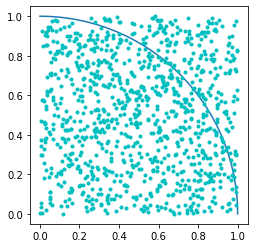

In [109]:
## pi = 4 * (No. of points inside circle / No.of points inside square)
import numpy as np
import math
import random
import matplotlib.pyplot as plt
%matplotlib inline

square_size = 1
points_inside_circle = 0
points_inside_square = 0
sample_size = 1000
arc = np.linspace(0, np.pi/2, 100)

def generate_points(size):
    x = random.random()*size
    y = random.random()*size
    return (x, y)

def is_in_circle(points, size):
    return math.sqrt(points[0]**2 + points[1]**2 <= size)

def compute_pi(points_inside_circle, points_inside_square):
    return 4 * (points_inside_circle / points_inside_square)

plt.axes().set_aspect('equal')
plt.plot(1*np.cos(arc), 1*np.sin(arc))

for i in range(sample_size):
    point = generate_points(square_size)
    plt.plot(point[0], point[1], 'c.')
    points_inside_square += 1
    if is_in_circle(point, square_size):
        points_inside_circle += 1

print("Appox. value of pi is {}".format(compute_pi(points_inside_circle,
                                                  points_inside_square)))    

In [86]:
import random
a = random.random()*5
a

2.427402265517623

## Blackjack with Monte Carlo

[2020-01-18 17:04:30,741] Making new env: Blackjack-v0
/home/varat/.local/lib/python3.6/site-packages/gym/envs/registration.py:17: PkgResourcesDeprecationWarning: Parameters to load are deprecated.  Call .resolve and .require separately.
  result = entry_point.load(False)


Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode terminated...
Episode te

TypeError: unsupported operand type(s) for -: 'list' and 'int'

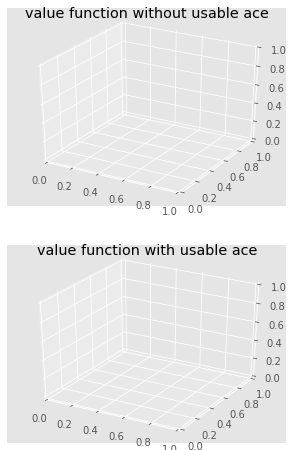

In [39]:
import gym
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from collections import defaultdict
from functools import partial
import numpy as np
%matplotlib inline

plt.style.use('ggplot')

## Blackjack environment
env = gym.make('Blackjack-v0')

def sample_policy(observation):
    score, dealer_score, useable_ace = observation
    return 0 if score >= 20 else 1

def generate_episode(policy, env):
    states, actions, rewards = [], [], []
    observation = env.reset()
    #till we reach the terminal state i.e. end of the episode
    while True:
        states.append(observation)
        action = sample_policy(observation)
        actions.append(action)
        observation, reward, done, info = env.step(action)
        rewards.append(reward)
        #if we reach the terminal state, we break
        if done:
            #print("Episode terminated...")
            break
    return states, actions, rewards

def first_visit_mc_prediction(policy, env, n_episodes):
    value_table = defaultdict(float)
    N = defaultdict(int)
    
    for _ in range(n_episodes):
        states, _, rewards = generate_episode(policy, env)
        returns = 0
        for t in range(len(states)-1,-1,-1):
            R = rewards[t]
            S = states[t]
            returns += R
            if S not in states[:t]:
                N[S] += 1
                value_table[S] += (returns - value_table[S]) / N[S]
    return value_table

def plot_blackjack(V, ax1, ax2):
    player_sum = np.arange(12, 21+1)
    deaker_show = np.arange(1, 10+1)
    usable_ace = np.arange([False, True])
    
    status_values = np.zeros(len(player_sum),
                            len(dealer_show),
                            len(usable_ace))
    
    for i, player in enumerate(player_sum):
        for j, dealer in enumerate(dealer_show):
            for k, ace in enumerate(usable_ace):
                states_values[i,j,k] = V[player, dealer, ace]
                
    X, Y = np.meshgrid(player_sum, dealer_show)
    
    ax1.plot_wireframe(X,Y,state_values[:,:,0])
    ax2.plot_wireframe(X,Y,state_values[:,:,1])
    
    for ax in ax1, ax2:
        ax.set_zlim(-1,1)
        ax.set_ylabel('player_sum')
        ax.set_xlabel('dealer showing')
        ax.set_zlable('state-value')
            
value = first_visit_mc_prediction(sample_policy, env, n_episodes=500000)
print(value)
fig, axes = plt.subplots(nrows=2, figsize=(5,8),
                                subplot_kw={'projection': '3d'})
axes[0].set_title('value function without usable ace')
axes[1].set_title('value function with usable ace')
plot_blackjack(value, axes[0], axes[1])

In [36]:
import gym
env = gym.make('Pendulum-v0')
print("State space: ",env.observation_space)
print("Action space:", env.action_space)
for i_episodes in range(20):
    observation = env.reset()
    for t in range(100):
        env.render()
        #print(observation)
        action = env.action_space.sample() #random actions
        print(action)
        observation, reward, done, ifno = env.step(action)

        if done:
            print("Episode finished after {} timesteps".format(t+1))
            break
env.close()

[2020-01-18 16:46:49,627] Making new env: Pendulum-v0


State space:  Box(3,)
Action space: Box(1,)
[-0.45228568]
[0.68778056]
[-0.33372614]
[-0.46412375]
[0.33607816]
[1.52311736]
[-1.58108635]
[0.95809145]
[-1.51143952]
[-0.59021281]
[1.33241741]
[0.69483539]
[-0.6695394]
[1.078878]
[-1.97975198]
[1.53323956]
[-0.22792216]
[1.95372861]
[0.43307312]
[-1.11125219]
[1.57653278]
[0.25724017]
[-1.62032556]
[-0.41217817]
[1.79176098]
[-1.33689032]
[-1.30818482]
[0.54835894]
[0.18829826]
[-1.84417699]
[-1.36776231]
[1.68417673]
[-1.82222884]
[-0.01743668]
[1.36319829]
[0.97309662]
[-1.1689132]
[-1.21426552]
[1.21639522]
[-0.83903163]
[-0.8868245]
[1.38233086]
[-1.03509953]
[-0.90402849]
[0.73838526]
[0.25932076]
[-1.25823783]
[-1.39813092]
[-0.11037348]
[0.50968469]
[0.04242589]
[-0.79368771]
[-1.96417669]
[0.7430312]
[1.32391314]
[0.77096684]
[1.23337412]
[-1.95919292]
[-1.51512151]
[1.52336004]
[0.38459778]
[-1.3686751]
[-0.58660664]
[-0.60105351]
[1.43057291]
[-1.83351368]
[0.55748101]
[-1.87229014]
[-1.74525278]
[0.40261453]
[1.46612594]
[1.

[-1.25261016]
[1.82359222]
[1.03644184]
[-0.25571798]
[0.28570512]
[0.1472757]
[-1.90617789]
[-0.83347239]
[-0.26206019]
[-0.47192425]
[1.1718284]
[-0.51910524]
[1.6496765]
[0.10977408]
[-0.14628733]
[1.41379389]
[-1.90777562]
[1.69392699]
[0.06856387]
[-0.2383672]
[-1.46984672]
[-1.06190315]
[-0.77484074]
[-0.68702919]
[-1.79524728]
[-1.07018559]
[0.93794204]
[-1.68287618]
[-1.17059711]
[-1.32146645]
[1.42329559]
[0.8141808]
[-1.08965229]
[1.15732131]
[-0.03188457]
[-1.81725715]
[0.17916056]
[-0.18863576]
[0.56315123]
[-0.19198698]
[1.794868]
[0.61720041]
[-1.32690626]
[0.80927691]
[-0.23389023]
[1.19557541]
[-0.78860118]
[1.14374328]
[-1.00536624]
[-1.92004994]
[-1.50166049]
[-1.25097401]
[-1.71400491]
[1.46087767]
[0.16467757]
[-0.55103801]
[0.44619102]
[1.14299759]
[1.28213562]
[0.24027692]
[0.76567765]
[-0.95009081]
[-1.15371424]
[-0.82836955]
[0.74960992]
[-0.92155342]
[-1.53289408]
[-0.01401929]
[0.83616136]
[-1.51318741]
[-0.03446822]
[1.51761557]
[-0.45577153]
[1.37248787]
[-1

[-0.11353039]
[-1.2482171]
[-0.59725046]
[0.37450632]
[-1.76975366]
[1.18506683]
[-1.93313268]
[-0.23749226]
[0.59046237]
[1.51834086]
[-0.31001273]
[-0.31570298]
[-0.33973276]
[1.80159747]
[0.36981534]
[-0.83455562]
[-0.48585817]
[-0.59124135]
[-1.24500091]
[0.05170557]
[0.13453531]
[-1.51848144]
[-0.4858573]
[0.38482585]
[-0.29038799]
[1.30239054]
[1.93333504]
[-1.01710736]
[-1.11770751]
[-0.83653953]
[1.45832228]
[1.75572761]
[-0.26048635]
[1.37493231]
[-0.65399929]
[1.54788503]
[-0.7931105]
[-0.63069175]
[1.42705138]
[-0.36120054]
[1.13350138]
[1.82079854]
[-1.80822634]
[0.72351048]
[-1.0867169]
[-1.57698865]
[-0.63318474]
[-0.30370711]
[-0.99972086]
[-0.67671024]
[-0.84909447]
[-0.50200238]
[-1.05189055]
[0.03861314]
[-0.92597855]
[0.44168329]
[-0.95770499]
[0.96208145]
[0.28140518]
[1.4704418]
[1.82717149]
[0.71653024]
[-1.9338954]
[0.24218655]
[0.69611626]
[0.18749404]
[1.68325578]
[-1.74596725]
[-0.37742982]
[0.3306525]
[0.15434676]
[0.05565255]
[-0.3647862]
[-0.27919282]
[0.35

[1.60631585]
[-1.70985729]
[0.79459459]
[-0.03803545]
[1.42062452]
[-1.88136924]
[-0.39164515]
[0.22136518]
[-0.22500078]
[1.25108727]
[0.76183292]
[1.47724635]
[-0.84060478]
[0.74488438]
[-1.38678516]
[1.92069967]
[1.94728615]
[-1.06524641]
[-0.21776742]
[-0.47260841]
[-0.77878337]
[1.70396277]
[1.02984655]
[1.03834354]
[1.69507283]
[0.46225716]
[-1.70864032]
[-1.25517511]
[-0.90521053]
[-1.27303007]
[-1.81270996]
[-0.54052868]
[-1.2299926]
[-0.44969722]
[-0.53161687]
[-0.84369861]
[0.78031968]
[-0.30574877]
[0.22761522]
[-0.05853056]
[-1.88647522]
[-0.5845032]
[1.34187529]
[1.53916489]
[-1.88191618]
[1.49855006]
[-1.61523325]
[0.4685743]
[1.9508016]
[1.93708951]
[0.89854042]
[0.6506447]
[-1.12679854]
[0.83211882]
[1.16980264]
[-0.04676452]
[1.21881233]
[1.37977213]
[-0.2684528]
[1.8515923]
[0.70860485]
[-0.23263405]
[-0.78329244]
[-1.15754142]
[0.18149219]
[0.51446743]
[-0.49661166]
[0.95504103]
[0.82008886]
[-0.21615983]
[0.50300153]
[-0.21747332]
[-1.68924314]
[1.00655294]
[1.49044